<a href="https://colab.research.google.com/github/llafcode/IntroDL_EX03_AutoLyrics/blob/master/EX03_Tom.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Installation



This code installs a time utility to measure run time of cells.

In [0]:
%%capture
!pip install ipython-autotime

%load_ext autotime

The dataset was uploaded to [llafcode/IntroDL_EX03_AutoLyrics](https://github.com/llafcode/IntroDL_EX03_AutoLyrics), so we first need to clone the repository, with the data. To make things easier, we also define:

*   `repo_path` - the repository path (this should be cross platrform since we use `os` module)
*   `train_path` - the train dataset path
*   `test_path` - the test dataset path



In [2]:
%%capture
import os

# Clone the entire repo.
!git clone -s git://github.com/llafcode/IntroDL_EX03_AutoLyrics.git AutoLyrics
repo_path = os.path.join(os.getcwd(), 'AutoLyrics')
train_melody_path = os.path.join(repo_path, 'data', 'midi_files', 'train')
test_melody_path = os.path.join(repo_path, 'data', 'midi_files', 'test')
train_data = os.path.join(repo_path, 'data', 'lyrics_train_set.csv')
test_data = os.path.join(repo_path, 'data', 'lyrics_test_set.csv')

time: 1.67 s


Next, we install TensorFlow 2.0 and import it

In [3]:
%%capture
from __future__ import absolute_import, division, print_function, unicode_literals

# !pip install -q tensorflow-gpu==2.0.0-alpha0
!pip install -q tf-nightly-gpu-2.0-preview

import tensorflow as tf
AUTOTUNE = tf.data.experimental.AUTOTUNE

# For potential eager executions
# tf.enable_eager_execution()

time: 4.68 s


For reproducible results, we init numpy and tensorflow random seed with same values

In [4]:
import pandas as pd
import numpy as np
np.set_printoptions(precision=4)
np.random.seed(2)

if tf.__version__[0] == '2':
  tf.random.set_seed(2)  
else:
  tf.random.set_random_seed(2)

# Make sure we are set to GPU (under Runtime->Change runtime type)
print('Running on GPU' if tf.test.is_gpu_available() else 'Please change runtime type to GPU on Google Colab under Runtime')

Running on GPU
time: 201 ms


In [5]:
import matplotlib.pyplot as plt
%matplotlib inline

# For putting audio in the notebook
import IPython.display

import seaborn as sns
sns.set()
# sns.set(rc={'figure.figsize':(15,15)})
# sns.set_palette('Paired', 12)

time: 227 ms


Download pretrain weights

In [6]:
# %%capture
# !rm -r glove_pretrained
# !rm -r glove.6B.zip

# !wget http://nlp.stanford.edu/data/glove.6B.zip
# !unzip glove.6B.zip -d glove_pretrained

time: 1.42 ms


# Dataset analysis

In the csv file, there are more than three columns. We are currently not sure what are the other columns, and for the initial experiment, we start with only the first three columns.

In [7]:
def remove_noise_char(lyrics):
  # Replace '' with " (later remove it)
  ret = lyrics.str.replace(r"''", '"')
  
  # Replace ` with '
  ret = ret.str.replace(r'`', "'")
  
  # Replace / with - (appears in 24/7)
  ret = ret.str.replace(r'/', '-')

  # Replace three ? with one
  ret = ret.str.replace('\?\?\?', '?')

  # Replace all brackets, :;#", and weird chars
  ret = ret.str.replace(r'[\[\]()\{\}:;#\*"ã¤¼©¦­!?]', '')
  
  # Remove certain words
  for word in ['chorus', '\-\-\-', '\-\-']:
    ret = ret.str.replace(word, '')
    
  # Replace these words with space
  for word in ['\.\.\.\.\.', '\.\.\.\.', '\.\.\.', '\.\.', " '"]:
    ret = ret.str.replace(word, ' ')
    
  # Remove duplicate spaces
  ret = ret.apply(lambda s: ' '.join(s.split()))
  return ret

time: 159 ms


In [8]:
from collections import Counter

def plot_word_freq(column):
  counts = Counter(column.str.cat(sep=' ').split(' '))
  labels, values = zip(*counts.items())
  
  print(f'Total number of words (raw): {len(labels)}')
  
  plt.plot(values)
  plt.show()
  return labels

time: 10.5 ms


Total number of words (raw): 7933


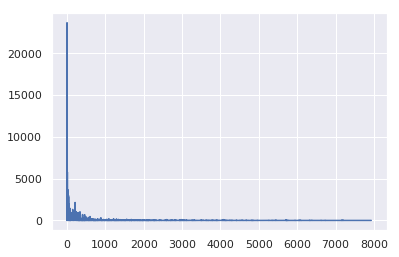

7933
6615


,artist,song,text
0,elton john,candle in the wind,goodbye norma jean & though i never knew you a...
1,gerry rafferty,baker street,winding your way down on baker street & lite i...
2,gerry rafferty,right down the line,you know i need your love & you've got that ho...
3,2 unlimited,tribal dance,come on check it out ya'll & come on come on &...
4,2 unlimited,let the beat control your body,let the beat control your body & let the beat ...


time: 302 ms


In [9]:
df_train = pd.read_csv(train_data, usecols=[0,1,2], names=['artist', 'song', 'text'])
df_train.text = remove_noise_char(df_train.text)

vocab = plot_word_freq(df_train.text)

counts = Counter(df_train.text.str.cat(sep=' ').split(' '))
labels, values = zip(*counts.items())
print(len(labels))
print(df_train.text.str.len().max())
df_train.head()

## Prepare Tensorboard [collapse]

In [10]:
%%capture
!rm -r ngrok-stable-linux-amd64.zip
!rm -r ngrok
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
!unzip ngrok-stable-linux-amd64.zip

# Load the TensorBoard notebook extension
# %load_ext tensorboard.notebook
%load_ext tensorboard

# Clear any logs from previous runs
!rm -rf ./logs/

LOG_DIR = 'logs/fit'

get_ipython().system_raw(f'tensorboard --logdir {LOG_DIR} --host 0.0.0.0 --port 6006 &')

get_ipython().system_raw('./ngrok http 6006 &')

time: 10.4 s


In [11]:
%tensorboard --logdir logs/fit

time: 2.54 s


# A lyric generation approach using LSTM (without melodies)

Our first architectures ignores the melodies and learns to generate words using the lyrics only.
This will be an important milestone on our way towards our goal of learning to generate lyrics by learning melodies and lyrics.

In this section, we present two separate architectures:


1.   Using pretrain embedding weights
2.   Learning the embedding ourself


For these two architectures, we use the following function that enable us to run multiple runs together




In [12]:
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.preprocessing.sequence import pad_sequences

# import nltk
# nltk.download('punkt', quiet=True)
# from nltk import word_tokenize

# This is hotfix for test set
_le_hot_fix = ['concerned', 'sympathize', 'truthfulness', 'pondered', 'barbie', 'bimbo', 'dolly', 'hanky', 'hiya', 'ken', 'panky', "rock'n'roll", 'undress', 'commiserating', 'roses', 'surprises', 'windmill']

def load_and_preprocess(csv_path, melody_dir=None, embedding=None, le=None, PAD=None, maxlen=6630):
  ret = pd.read_csv(csv_path, usecols=[0,1,2], names=['artist', 'song', 'text'])

  # Get song path and add to dataframe
  if melody_dir is not None:
    artist_song = ret[['artist', 'song']].apply(lambda x: ' - '.join(x), axis=1)
    ret['song_path'] = list(map(
        lambda path: f'{melody_dir}/{path}', 
        filter(
            lambda path: path.split('.')[0].replace('_', ' ').lower() in artist_song.values,
            os.listdir(melody_dir)
        )
    ))
    ret = ret.drop(['artist', 'song'], axis=1).reindex(columns=['song_path', 'text'])
  
  ret.text = remove_noise_char(ret.text).str.split()  
  
  if le is None:    
    fit_data = ret.text.sum() + _le_hot_fix


    if PAD is not None:
      fit_data.append(PAD)
    le = LabelEncoder().fit(fit_data)
  
  ret['text_encoded'] = ret.text.apply(le.transform)
  
#   if PAD is not None:
#     ret['text_encoded_padded'] = pad_sequences(
#         ret.text_encoded,
#         value=le.transform([PAD])[0],
#         padding='post',
#         maxlen=maxlen)
  
  if embedding is not None:
    ret['text_embedded'] = ret.text.apply(lambda text: get_weight_matrix(embedding, text))
       
  return ret, le

# Instead of choosing the word with highest probability, 
# we choose the next word by sampling from the output probability distribution
def sample(vocab, preds):
  return np.random.choice(vocab, 1, p=preds)

def predict_step_by_step(model, intial_contexts, le, output_length=10):
  le_classes_hotfix = list(le.classes_)
  for i in _le_hot_fix:
    le_classes_hotfix.remove(i)
  print('####################')
  for intial_context in intial_contexts:
    print('--------------------------------')
    print(f'Generating lyrics for initial word {intial_context}')
    next_word = output_sentence = [intial_context]    
    for i in range(output_length):
      context = next_word
      ds = tf.data.Dataset.from_tensor_slices((le.transform(context))).batch(batch_size=1)
      preds = model.predict(ds).squeeze()
      next_word = sample(le_classes_hotfix, preds)
      #next_word = np.argmax(preds, axis=1)
      output_sentence.append(next_word[0])
    print(' '.join(output_sentence).replace('& ', '&\n'))
    print(f"Done '{intial_context}'--------------------------------")

time: 118 ms


### Test [collapse]

In [13]:
df_tmp, le_tmp = load_and_preprocess(csv_path=train_data, 
#                                      PAD=' <PAD>',
                                     PAD=None,
                                     maxlen=6630)

time: 1.3 s


In [0]:
# tmp = pad_sequences(
#         df_tmp.text_encoded,
#         value=le_tmp.transform([' <PAD>'])[0],
#         padding='post',
#         maxlen=6630)


## Architecture #1 - Using Pretrained word2vec (Glove)

In this architecture, we shall use the pretrained weights that can be found at [http://nlp.stanford.edu/data/glove.6B.zip](http://nlp.stanford.edu/data/glove.6B.zip)

The 822.24 MB zip file contains four weights for 50, 100, 200, and 300 embedding size. We shall use the 300 embedding size version.

In [14]:
# Load the pre-trained Glove Word2Vec embeddings
def load_embedding(filename='glove_pretrained/glove.6B.300d.txt'):
  """
  input:
  @filename: a .txt file of the pre-trained word2vec embedding
  
  output:
  @embedding: a dictionary of word vectors. Keys are distinct words and values are the word vectors
  """
  with open(filename, 'r') as f:
    lines = f.readlines()
  
  # key is string word, value is numpy array for vector
  embedding = { parts[0]: np.asarray(parts[1:], dtype='float32') for parts in map(lambda line: line.split(), lines) }
  return embedding

# create a weight matrix for the Embedding layer from a loaded embedding
def get_weight_matrix(embedding, vocab):
    """
    input:
    @embedding: dictionary of word vectors (all words in the pre-trained model)
    @vocab: vocabulary of the lyrics dataset
    
    output:
    @weight_matrix: a n*300 numpy array, where n is the total number of words in the vocabulary.
                    each row of this matrix is a 300 dimension word vector of the ith word in vocab.
    """    
    # total vocabulary size plus 0 for unknown words
    vocab_size = len(vocab)
#     print(f'There are {vocab_size} words in this song.')
    # define weight matrix dimensions with all 0
    weight_matrix = np.zeros((vocab_size, 300))
    # step vocab, store vectors using the Tokenizer's integer mapping
    vectors = map(lambda word: embedding.get(word), vocab)
    for i, vector in enumerate(vectors):
      if vector is not None:
        weight_matrix[i] = vector
    return weight_matrix
  
  
def create_tf_dataset(X, y, batch_size, buffer_size=1e4):
  ds = tf.data.Dataset.from_tensor_slices((X, y)).batch(batch_size=batch_size).repeat()
#   if shuffle:
#     ds = ds.shuffle(buffer_size=buffer_size)
  return ds

time: 16.4 ms


In [15]:
import datetime, math
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint

from tensorflow.keras.layers import Embedding, Dense, GlobalAveragePooling1D
if tf.__version__[0] == '2':
  from tensorflow.keras.layers import LSTM
  print('Loaded LSTM')
else:
  from tensorflow.keras.layers import CuDNNLSTM as LSTM
  print('Loaded CuDNNLSTM')

from tensorflow.keras.models import Sequential
from sklearn.model_selection import train_test_split

def create_and_train_LSTM_lyrics(
    train_data,
    log_dir='logs/fit',
    model=None,
    batch_size=4096, lr=1e-2, epochs=100, validation_split=0.2,
    patience=3, min_delta=.001,
    loss='sparse_categorical_crossentropy', optimizer=None, metrics=['accuracy'],
    prefix='', verbose=1,
    embedding_dim=300,
    PAD=' <PAD>', maxlen=6630,
    embedding=None, shuffle=True,
    random_state=2,
):
  
  if optimizer is None:
    optimizer = Adam(lr=lr)
  
  run_time = datetime.datetime.now().strftime('%m%d-%H%M%S')
  run_name = f'{prefix}_{run_time}_lr{lr}_b{batch_size}'  
  
  df_train, le_train = load_and_preprocess(csv_path=train_data, PAD=PAD, maxlen=maxlen)
  
  train_text = np.concatenate(df_train.text_encoded if PAD is None else df_train.text_encoded_padded)

  X = train_text[:-1]
  y = train_text[1:]
  
  X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=validation_split, random_state=random_state)
  
  ds_train = create_tf_dataset(X_train, y_train, batch_size=batch_size)
  ds_val = create_tf_dataset(X_val, y_val, batch_size=batch_size)
  
  vocab_size = len(le_train.classes_)
    
  if embedding is not None:
    word_vectors = get_weight_matrix(embedding, le_train.classes_)
    embedding_layer = Embedding(
        vocab_size,
        embedding_dim,
        weights=[word_vectors],
        trainable=False,
    )
  else:
    embedding_layer = Embedding(
        vocab_size, embedding_dim,
    )
  
  # define model
  if model is None:
    model = Sequential([
        embedding_layer,
        LSTM(embedding_dim),
        Dense(vocab_size, activation='softmax')    
    ])
    print(model.summary())

  
  callbacks = [
      EarlyStopping(patience=patience, min_delta=min_delta, verbose=verbose),
      ModelCheckpoint(f'{run_name}.h5', verbose=0, save_best_only=True, save_weights_only=True)
  ]
  
  if tf.__version__[0] == '2':
    callbacks.append(TensorBoard(log_dir=f'{log_dir}/{run_name}'))

  model.compile(
      loss=loss,
      optimizer=optimizer, 
      metrics=metrics)

  history = model.fit(
      ds_train,
      epochs=epochs,
      callbacks=callbacks,
      verbose=verbose,
      shuffle=True,
      steps_per_epoch=math.ceil(len(X_train) / batch_size),
#       batch_size=batch_size,
      validation_data=ds_val,
      validation_steps=math.ceil(len(X_val) / batch_size),
#       validation_split=validation_split
  )
  return model, le_train, callbacks

def model_eval_LSTM_lyrics(
    test_data,
    model,
    le,
    callbacks=None,
    batch_size=4096,
    verbose=1,
    PAD=' <PAD>', maxlen=6630,    
):
  df_test, le_test = load_and_preprocess(csv_path=test_data, PAD=PAD, maxlen=maxlen, le=le)
  
  test_text = np.concatenate(df_test.text_encoded if PAD is None else df_test.text_encoded_padded)
  
  ds_test = create_tf_dataset(test_text[:-1], test_text[1:], batch_size=batch_size)
  
  model.evaluate(
      ds_test,
      callbacks=callbacks,
      verbose=verbose,
      steps=math.ceil((len(test_text) - 1) / batch_size),
  )

Loaded LSTM
time: 84.4 ms


In [16]:
print('Loading Embeddings')
raw_embedding = load_embedding()
print('Finish Loading Embeddings')

Loading Embeddings
Finish Loading Embeddings
time: 25.2 s


In [0]:
batch_size = 4096*4

model_pre_train, le_pre_train, cb_pre_train = create_and_train_LSTM_lyrics(
    train_data,
    batch_size=batch_size, lr=1e-3, validation_split=0.2,
    epochs=100,
#     patience=3, min_delta=.001,
#     loss='sparse_categorical_crossentropy', metrics=['accuracy'],
    prefix='pre_train', verbose=1,
#     embedding_dim=300,
    PAD=None,# maxlen=6630,
    embedding=raw_embedding,
)

In [0]:
model_eval_LSTM_lyrics(
    test_data,
    le=le_pre_train,
    model=model_pre_train,
    callbacks=cb_pre_train,
    batch_size=batch_size,
    verbose=1,
    PAD=None,    
)

predict_step_by_step(model_pre_train, ['i'], le_pre_train, output_length=100)

## Architecture #2 - Training Our Own Embeddings

In [29]:
model_our_embed, le_our_embed = create_and_train_LSTM_lyrics(
    train_data,
    batch_size=4096*8, lr=1e-3, validation_split=0.2,
    epochs=100,
#     patience=3, min_delta=.001,
#     loss='sparse_categorical_crossentropy', metrics=['accuracy'],
    prefix='our_embedding', verbose=1,
#     embedding_dim=300,
    PAD=None,# maxlen=6630,
#     embedding=None,
)

predict_step_by_step(model_our_embed, 'i', le_our_embed, output_length=100)

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_6 (Embedding)      (None, None, 300)         2379900   
_________________________________________________________________
lstm_6 (LSTM)                (None, 300)               721200    
_________________________________________________________________
dense_6 (Dense)              (None, 7933)              2387833   
Total params: 5,488,933
Trainable params: 5,488,933
Non-trainable params: 0
_________________________________________________________________
None
Epoch 1/100
5/5 [==============================] - 4s 758ms/step - loss: 8.9747 - accuracy: 0.0444 - val_loss: 8.9681 - val_accuracy: 0.1454
Epoch 2/100
5/5 [==============================] - 2s 351ms/step - loss: 8.9624 - accuracy: 0.1512 - val_loss: 8.9525 - val_accuracy: 0.1559
Epoch 3/100
5/5 [==============================] - 2s 356ms/step - loss: 8.9422 - accur

W0804 14:52:32.581886 140496246310784 training_utils.py:1211] When passing input data as arrays, do not specify `steps_per_epoch`/`steps` argument. Please use `batch_size` instead.
W0804 14:52:33.337689 140496246310784 training_utils.py:1211] When passing input data as arrays, do not specify `steps_per_epoch`/`steps` argument. Please use `batch_size` instead.
W0804 14:52:33.357418 140496246310784 training_utils.py:1211] When passing input data as arrays, do not specify `steps_per_epoch`/`steps` argument. Please use `batch_size` instead.
W0804 14:52:33.373695 140496246310784 training_utils.py:1211] When passing input data as arrays, do not specify `steps_per_epoch`/`steps` argument. Please use `batch_size` instead.
W0804 14:52:33.390733 140496246310784 training_utils.py:1211] When passing input data as arrays, do not specify `steps_per_epoch`/`steps` argument. Please use `batch_size` instead.
W0804 14:52:33.408870 140496246310784 training_utils.py:1211] When passing input data as arrays

i don't don't go so webster wohl hei &
but they gotta squeeze her shoes &
turn me &
hear this is close and take my baggy slut before &
a lot of walk home &
is for it baby would i &
it's not the skies are at my heart &
i'm an angel sup-p-per troup-p-per &
one who dirty cloud to georgia &
but it'll do i'm gonna make me mend my girl you've been the sacrificial point &
&
tha border &
you're where you know it in me with you wouldn't give me moving eternity &
chairs
time: 3min 10s


# A lyric generation approach using LSTM (with melodies)

## Playing with midi files

Import pretty midi

In [41]:
import pretty_midi
# For plotting
import mir_eval.display
import librosa.display

time: 908 ms


The documentation of Pretty_midi is availabel [here](https://craffel.github.io/pretty-midi/), and a jupyter notebook tutorial is available [here](https://nbviewer.jupyter.org/github/craffel/pretty-midi/blob/master/Tutorial.ipynb).

A great way to visualize MIDI data is via a piano roll, which is a time-frequency matrix where each row is a different MIDI pitch and each column is a different slice in time. pretty_midi can produce piano roll matrices for each indivual instrument (via Instrument.get_piano_roll) or the entire PrettyMIDI object (summed across instruments, via PrettyMIDI.get_piano_roll). The spacing in time between subsequent columns of the matrix is determined by the fs parameter.

In [44]:
# Load a single mid file
pm = pretty_midi.PrettyMIDI(os.path.join(train_melody_path, '1910_Fruitgum_Company_-_Simon_Says.mid'))
pm2 = pretty_midi.PrettyMIDI(os.path.join(train_melody_path, '2_Unlimited_-_Get_Ready_for_This.mid'))
pm3 = pretty_midi.PrettyMIDI(os.path.join(train_melody_path, 'Aaliyah_-_Try_Again.mid'))
pm4 = pretty_midi.PrettyMIDI(os.path.join(train_melody_path, 'Cherry_Poppin_Daddies_-_Zoot_Suit_Riot.mid'))

print('1: ', pm.get_piano_roll().shape)
print('2: ', pm2.get_piano_roll().shape)
print('3: ', pm3.get_piano_roll().shape)
print('4: ', pm4.get_piano_roll().shape)

1:  (128, 15843)
2:  (128, 43824)
3:  (128, 28294)
4:  (128, 22987)
time: 2.19 s


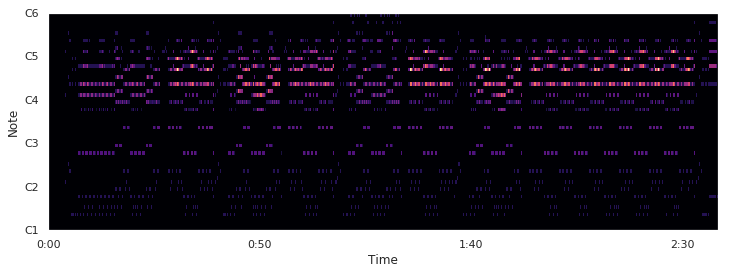

time: 1.63 s


In [45]:
def plot_piano_roll(pm, start_pitch, end_pitch, fs=100):
  # Use librosa's specshow function for displaying the piano roll
  librosa.display.specshow(pm.get_piano_roll(fs)[start_pitch:end_pitch],
                           hop_length=1, sr=fs, x_axis='time', y_axis='cqt_note',
                           fmin=pretty_midi.note_number_to_hz(start_pitch))
  
plt.figure(figsize=(12, 4))
plot_piano_roll(pm, 24, 84)

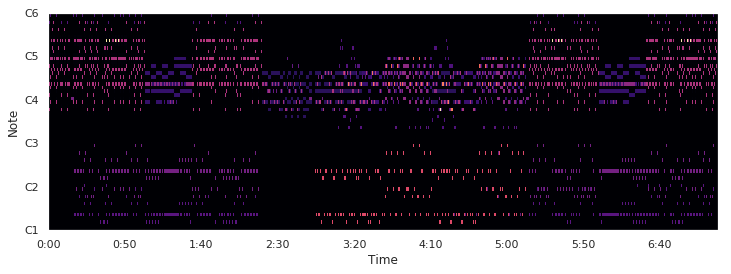

time: 4.05 s


In [46]:
plt.figure(figsize=(12, 4))
plot_piano_roll(pm2, 24, 84)

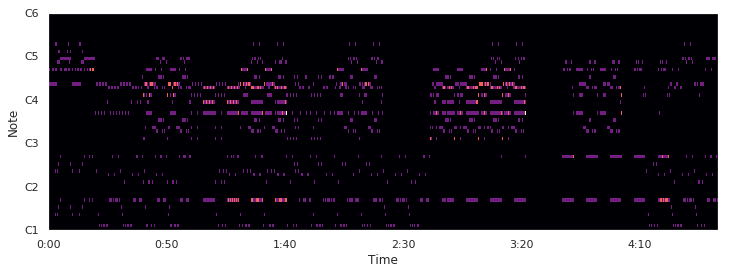

time: 2.5 s


In [47]:
plt.figure(figsize=(12, 4))
plot_piano_roll(pm3, 24, 84)

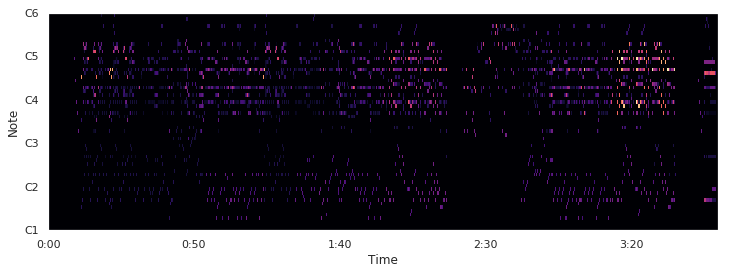

time: 2.23 s


In [48]:
plt.figure(figsize=(12, 4))
plot_piano_roll(pm4, 24, 84)

In [49]:
# The instruments list
print(pm.instruments)

[Instrument(program=18, is_drum=False, name="Organ"), Instrument(program=34, is_drum=False, name="Bass"), Instrument(program=48, is_drum=False, name="Strings"), Instrument(program=67, is_drum=False, name="Melody"), Instrument(program=25, is_drum=False, name="6 String"), Instrument(program=0, is_drum=False, name="12 String"), Instrument(program=0, is_drum=False, name="Chips"), Instrument(program=61, is_drum=False, name="Brass"), Instrument(program=53, is_drum=False, name="Syn Vox"), Instrument(program=0, is_drum=True, name="Kick"), Instrument(program=16, is_drum=False, name="Solo Organ")]
time: 1.65 ms


In [51]:
# Listen it!
IPython.display.Audio(pm.synthesize(fs=16000), rate=16000)
# Sounds like sine waves...

time: 2.5 s


In [50]:
# Let's look at what's in this MIDI file
print(f'There are {len(pm.time_signature_changes)} time signature changes')
print(f'There are {len(pm.instruments)} instruments')
print(f'Instrument 3 has {len(pm.instruments[2].notes)} notes')
print(f'Instrument 4 has {len(pm.instruments[3].pitch_bends)} pitch bends')
print(f'Instrument 5 has {len(pm.instruments[4].control_changes)} control changes')

There are 1 time signature changes
There are 11 instruments
Instrument 3 has 155 notes
Instrument 4 has 0 pitch bends
Instrument 5 has 4 control changes
time: 4.94 ms


EXCEPT:  /content/AutoLyrics/data/midi_files/train/Aaron_Neville_-_Tell_It_Like_It_Is.mid
EXCEPT:  /content/AutoLyrics/data/midi_files/train/Billy_Joel_-_Pressure.mid


/usr/local/lib/python3.6/dist-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)


EXCEPT:  /content/AutoLyrics/data/midi_files/train/Billy_Joel_-_Movin'_Out.mid
EXCEPT:  /content/AutoLyrics/data/midi_files/train/Dan_Fogelberg_-_Leader_of_the_Band.mid
EXCEPT:  /content/AutoLyrics/data/midi_files/train/Brian_McKnight_-_On_The_Down_Low.mid
EXCEPT:  /content/AutoLyrics/data/midi_files/train/Beastie_Boys_-_Girls.mid



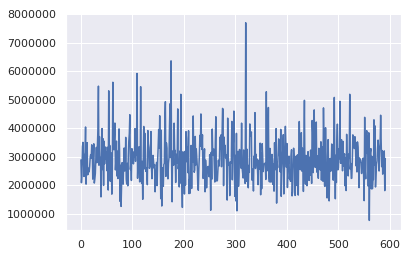

time: 3min 29s


In [42]:
import pathlib

from tqdm import tqdm_notebook as tqdm

def get_melody_paths(melody_path, partial=None):
  ret = list(map(str, pathlib.Path(melody_path).glob('*')))
  return ret if partial is None else ret[:partial]

train_melody_paths = get_melody_paths(train_melody_path)

piano_rolls_len = []
for pm_path in tqdm(train_melody_paths):
  try:
    piano_rolls_len.append(len(pretty_midi.PrettyMIDI(pm_path).get_piano_roll().flatten()))
  except:
    print('EXCEPT: ', pm_path)
    
plt.plot(piano_rolls_len)
plt.show()

## Train Model

In [52]:
from skimage.measure import block_reduce
from tqdm import tqdm_notebook as tqdm

def down_sample_piano_roll(piano_roll, block_size=(4,4)):
  return block_reduce(
      block_reduce(piano_roll, block_size=block_size, func=np.mean),
      block_size=(4,4), func=np.mean
  )

def load_and_preprocess_melody(
    melody_path,
    th_len=4000000, # 7696768,
    block_size=(4,4), 
):
  try:
    ret = pretty_midi.PrettyMIDI(melody_path).get_piano_roll()
    if block_size is not None:
      ret = down_sample_piano_roll(ret, block_size=block_size)
#     ret = ret.sum(axis=0)
    ret = ret.flatten()
    # print('Piano roll Loaded.')
    if th_len is not None:
      if len(ret) > th_len:
        # print('Piano roll too long, trimming...')
        ret = ret[:th_len]
      else:
        # print('Piano roll too short, padding...')
        ret = tf.keras.preprocessing.sequence.pad_sequences(
            [ret],
            value=0,
            padding='post',
            maxlen=th_len)[0]
    return ret
  except:
    print('EXCEPT', melody_path)
    return None

def input_generator(
    df,
    batch_size,
    th_len=4000000, # 7696768,
    block_size=(4,4),
):
  def helper():
    for song_id, row in tqdm(df.iterrows(), desc='song loop', total=df.shape[0]):
      pm = load_and_preprocess_melody(row['song_path'], th_len=th_len, block_size=block_size)
      for curr_word, next_word in zip(row['text_embedded'][:-1], row['text_encoded'][1:]):
        yield (curr_word, pm), next_word
  
  generator = helper()
  while True:
    curr_word_len = df.iloc[0]['text_embedded'][0].shape[0]
    curr_word_batch = np.zeros((batch_size, curr_word_len))  
    next_word_batch = np.zeros((batch_size, 1))
    pm_batch = np.zeros((batch_size, th_len))
    
    for i, ((curr_word, pm), next_word) in zip(range(batch_size), generator):
      curr_word_batch[i] = curr_word
      next_word_batch[i] = next_word
      pm_batch[i] = pm
        
    curr_word_batch = curr_word_batch.reshape(batch_size, 1, curr_word_len)
    next_word_batch = next_word_batch.reshape(batch_size, 1)
    pm_batch = pm_batch.reshape(batch_size, 1, th_len)

    yield (curr_word_batch, pm_batch), next_word_batch
    
def predict_step_by_step_with_melody(model, song_path, initial_word, le, embedding, th_len=12500, block_size=(4,4), output_length=100):
  pm = load_and_preprocess_melody(song_path, th_len=th_len, block_size=block_size).reshape(1, 1, th_len)      
  next_word = output_sentence = [initial_word]
  for i in range(output_length):
    curr_word = next_word
    preds = model.predict((get_weight_matrix(embedding, curr_word).reshape(1, 1, 300), pm)).squeeze()
    next_word = sample(list(le.classes_), preds)
    #next_word = np.argmax(preds, axis=1)
    output_sentence.append(next_word[0])
  print(' '.join(output_sentence).replace('& ', '&\n'))

time: 48.1 ms


In [55]:
import datetime, math
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import TensorBoard, EarlyStopping, ModelCheckpoint

from tensorflow.keras.layers import Input, Dense, concatenate, LeakyReLU
if tf.__version__[0] == '2':
  from tensorflow.keras.layers import LSTM
  print('Load LSTM')
else:
  from tensorflow.keras.layers import CuDNNLSTM as LSTM
  print('Load CuDNNLSTM')

from tensorflow.keras.models import Model
from sklearn.model_selection import train_test_split

def create_and_train_LSTM_melody(
    train_data,
    melody_dir,
    generator,
    model=None,
    batch_size=4096, lr=1e-2, epochs=100, validation_split=0.2,
    patience=3, min_delta=.001,
    loss='sparse_categorical_crossentropy', optimizer=None, metrics=['accuracy'],
    prefix='', verbose=2,
    embedding_dim=300,
    lstm_units=300,
    embedding=None,
    th_len=4000000, # 7696768,
    block_size=(4,4),
    random_state=2
):
  if embedding is None:
    embedding = load_embedding()  
  if optimizer is None:
    optimizer = Adam(lr=lr)
  
  run_time = datetime.datetime.now().strftime('%m%d-%H%M%S')
  run_name = f'{prefix}_{run_time}_lr{lr}_b{batch_size}'  

  df, le_train = load_and_preprocess(csv_path=train_data, melody_dir=melody_dir, embedding=embedding)   

  df_train, df_val = train_test_split(df, test_size=validation_split, random_state=random_state)
  print(f'Train length: {df_train.shape[0]}', f'Train words: {len(df_train.text.sum())}', f'Validation length: {df_val.shape[0]}', f'Validation words: {len(df_val.text.sum())}')

  vocab_size = len(le_train.classes_)

  # define model
  if model is None:
    curr_words_input = Input(shape=(1, embedding_dim), name='curr_words')
    melody_input = Input(shape=(1, th_len), name='melody')

    combined = concatenate([curr_words_input, melody_input], name='combined')
    x = LSTM(units=lstm_units, name='LSTM')(combined)
    x = Dense(vocab_size, activation='softmax', name='Dense')(x)

    model = Model(inputs=[curr_words_input, melody_input], outputs=x)
    
    print(model.summary())

  callbacks = [
      EarlyStopping(patience=patience, verbose=verbose, min_delta=min_delta),
      ModelCheckpoint(f'{run_name}.h5', verbose=0, save_best_only=True, save_weights_only=True)
  ]
  
  if tf.__version__[0] == '2':
    log_dir = f'logs/fit/{run_name}'
    callbacks.append(TensorBoard(log_dir=log_dir))

  model.compile(
      loss=loss,
      optimizer=optimizer, 
      metrics=metrics)

  history = model.fit_generator(
      generator=generator(df_train, batch_size=batch_size, th_len=th_len, block_size=block_size),
      epochs=epochs,
      callbacks=callbacks,
      verbose=verbose,
      shuffle=True,
#       batch_size=batch_size,
      steps_per_epoch=math.ceil(len(df_train.text.sum()) / batch_size),
      validation_data=generator(df_val, batch_size=batch_size, th_len=th_len, block_size=block_size),      
      validation_steps=math.ceil(len(df_val.text.sum()) / batch_size)
  )
  return model, le_train

Load LSTM
time: 50.2 ms


In [56]:
th_len = 12500 #4000000
block_size = (4,4)

model_down_sample, le_down_sample = create_and_train_LSTM_melody(
    train_data,
    melody_dir=train_melody_path,
    generator=input_generator,
    batch_size=1024, lr=1e-3, validation_split=0.2, 
    patience=3, min_delta=.01,
    prefix='down_sample',
    embedding=raw_embedding,
    lstm_units=1000,
    th_len=th_len,
    block_size=block_size,
    verbose=1,
)

print()
print()
predict_step_by_step_with_melody(model_down_sample, '/content/AutoLyrics/data/midi_files/train/ABBA_-_Money_Money_Money.mid', 'money', le_down_sample, raw_embedding, th_len=th_len, block_size=block_size, output_length=100)

Train length: 473 Train words: 143829 Validation length: 119 Validation words: 33736
Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
curr_words (InputLayer)         [(None, 1, 300)]     0                                            
__________________________________________________________________________________________________
melody (InputLayer)             [(None, 1, 12500)]   0                                            
__________________________________________________________________________________________________
combined (Concatenate)          (None, 1, 12800)     0           curr_words[0][0]                 
                                                                 melody[0][0]                     
__________________________________________________________________________________________________
LSTM (L

Epoch 1/100


/usr/local/lib/python3.6/dist-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)
/usr/local/lib/python3.6/dist-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)
/usr/local/lib/python3.6/dist-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)
/usr/local/lib/python3.6/dist-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI 

/usr/local/lib/python3.6/dist-packages/pretty_midi/pretty_midi.py:100: RuntimeWarning: Tempo, Key or Time signature change events found on non-zero tracks.  This is not a valid type 0 or type 1 MIDI file.  Tempo, Key or Time Signature may be wrong.
  RuntimeWarning)



141/141 - 245s - loss: 6.2500 - accuracy: 0.1382 - sparse_categorical_accuracy: 0.1382 - val_loss: 6.0817 - val_accuracy: 0.1407 - val_sparse_categorical_accuracy: 0.1407
Epoch 2/100
141/141 - 27s - loss: 3.0886 - accuracy: 1.0000 - sparse_categorical_accuracy: 1.0000 - val_loss: 0.0088 - val_accuracy: 1.0000 - val_sparse_categorical_accuracy: 1.0000
Epoch 3/100
141/141 - 27s - loss: 0.0060 - accuracy: 1.0000 - sparse_categorical_accuracy: 1.0000 - val_loss: 0.0041 - val_accuracy: 1.0000 - val_sparse_categorical_accuracy: 1.0000
Epoch 4/100
141/141 - 27s - loss: 0.0032 - accuracy: 1.0000 - sparse_categorical_accuracy: 1.0000 - val_loss: 0.0024 - val_accuracy: 1.0000 - val_sparse_categorical_accuracy: 1.0000
Epoch 5/100
141/141 - 28s - loss: 0.0020 - accuracy: 1.0000 - sparse_categorical_accuracy: 1.0000 - val_loss: 0.0016 - val_accuracy: 1.0000 - val_sparse_categorical_accuracy: 1.0000
Epoch 6/100
141/141 - 28s - loss: 0.0014 - accuracy: 1.0000 - sparse_categorical_accuracy: 1.0000 - 

W0804 15:20:37.536611 140496246310784 training_utils.py:1211] When passing input data as arrays, do not specify `steps_per_epoch`/`steps` argument. Please use `batch_size` instead.


TypeError: ignored

time: 7min 51s


In [0]:
predict_step_by_step_with_melody(model_down_sample, '/content/AutoLyrics/data/midi_files/test/Aqua_-_Barbie_Girl.mid', 'day', le_down_sample, raw_embedding, th_len=th_len, block_size=block_size, output_length=100)